# Tidal Correction Modeling with PyTMD

by Jessica Scheick

This notebook displays the calculations and rationale that were used to develop a Python-based tidal correction approach for determining tidal heights (including local minima and maxima) for use in correcting DEMs to sea level and estimating iceberg freeboard uncertainty, as originally described in Scheick et al 2019 Remote Sensing.

**REQUIREMENTS**
* [PyTMD](https://github.com/tsutterley/pyTMD)
* tidal model files (obtain using PyTMD.scripts.arcticdata_tides.py)
* [icebath](https://github.com/JessicaS11/icebath)
* DEM (if you want to be able to run/plot the earlier sections)


In [ ]:
# From within terminal - you'll need both icebath and pyTMD to run this notebook
%pip install pyTMD
%pip install -e. # from within icebath directory

In [2]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import hvplot.xarray
import holoviews as hv
from holoviews import dim, opts
import datetime as dt
from pyTMD.compute_tide_corrections import compute_tide_corrections

In [3]:
%load_ext autoreload
import icebath.core as icebath
from icebath.core import build_xrds
%autoreload 2

## Read in DEM and plot

Note: this requires that you have a previously downloaded DEM.

In [4]:
#Ilulissat Isfjord Mouth, resampled to 50m using CHANGES
data = build_xrds.read_DEM('/home/jovyan/icebath/notebooks/supporting_docs/Elevation/ArcticDEM/Regridded_50m_tiles/n69w052/SETSM_GE01_20120629_1050410000D4F700_1050410000C40800_seg1_2m_v3.0_dem_regridded_50m.tif')

In [5]:
data

<xarray.DataArray 'elevation' (y: 277, x: 349)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * y        (y) float64 -2.253e+06 -2.253e+06 ... -2.267e+06 -2.267e+06
  * x        (x) float64 -2.484e+05 -2.483e+05 ... -2.31e+05 -2.31e+05
Attributes:
    transform:      (50.0, 0.0, -248400.0, 0.0, -50.0, -2253200.0)
    crs:            +init=epsg:3413
    res:            (50.0, 50.0)
    is_tiled:       0
    nodatavals:     (nan,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Area
    date-time:      2012-08-16 10:33:00

In [6]:
dem = data.hvplot.image(rasterize=True, dynamic=True, aspect="equal", cmap='magma')
print(dem)
dem

:DynamicMap   []


:DynamicMap   []
   :Image   [x,y]   (elevation)

## Tidal Height Calculation (using Tyler Sutterly's pyTMD library)

modified from: https://github.com/SmithB/pointCollection/blob/master/notebooks/tide_demo.ipynb

### Point-wise tidal heights
Compute tide at time EPOCH across a series of x and y values

In [7]:
xlimits = np.array([min(data.x.values),max(data.x.values)])
ylimits = np.array([min(data.y.values),max(data.y.values)])
x=np.linspace(xlimits[0],xlimits[1],100)
y=np.linspace(ylimits[0],ylimits[1],100)
t=np.zeros((100))*3600

In [8]:
print(xlimits)
print(ylimits)
print(data.attrs['date-time'].timetuple()[0:6])

[-248375. -230975.]
[-2267025. -2253225.]
(2012, 8, 16, 10, 33, 0)


In [9]:
tide = compute_tide_corrections(x,y,t,
    DIRECTORY='/home/jovyan/pyTMD/models', MODEL='AOTIM-5-2018',
    EPOCH=data.attrs['date-time'].timetuple()[0:6], TYPE='drift', TIME='utc', EPSG=3413)

In [10]:
plot_tides = np.array([[x[i], y[i], tide.data[i]] for i in range(0,len(x))])
tides = hv.Points(plot_tides, vdims='tide')
tides.opts(color='tide', colorbar=True, cmap='BuPu')
tides

:Points   [x,y]   (tide)

The large range in tidal heigh over such a short distance seems slightly odd (given it's only for one time). Plotting it over the DEM doesn't help clarify.

In [11]:
dem*tides

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [x,y]   (elevation)
      .Points.I :Points   [x,y]   (tide)

### Full spatial grid of tidal heights
Compute tide at time EPOCH across a grid of x and y values to check on spatial distribution.

In [12]:
x = np.arange(xlimits[0],xlimits[1]+1000,30)
y = np.arange(ylimits[1],ylimits[0]-1000,-30)
xgrid,ygrid = np.meshgrid(x,y)
t = 0.0
tide2 = compute_tide_corrections(xgrid,ygrid,t,
    DIRECTORY='/home/jovyan/pyTMD/models',MODEL='AOTIM-5-2018',
    EPOCH=data.attrs['date-time'].timetuple()[0:6], TYPE='grid', TIME='utc', EPSG=3413)

In [13]:
tide2rs = tide2.data.reshape(tide2.shape[0:2])

This results in a rather funny-shaped set of tidal heights and values.

In [14]:
# tides2 = hv.Image((xgrid[0,:], ygrid[:,0], tide2rs), aspect='equal')
tides2 = hv.Image((x, y, tide2rs))
tides2.opts(colorbar=True, cmap="BuPu", aspect='equal')
tides2

:Image   [x,y]   (z)

In [15]:
print(np.nanmin(tide2))
print(np.nanmax(tide2))
print(np.nanmean(tide2))

5.211197381279207e-07
0.4400082546891129
0.2994831670095853


/srv/conda/envs/notebook/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/srv/conda/envs/notebook/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([ 18623.,  15467.,  14685.,  14441.,  13228.,  12449.,  12177.,
         12349.,  13286., 111287.]),
 array([5.21119738e-07, 4.40012945e-02, 8.80020678e-02, 1.32002841e-01,
        1.76003615e-01, 2.20004388e-01, 2.64005161e-01, 3.08005935e-01,
        3.52006708e-01, 3.96007481e-01, 4.40008255e-01]),
 <a list of 10 Patch objects>)

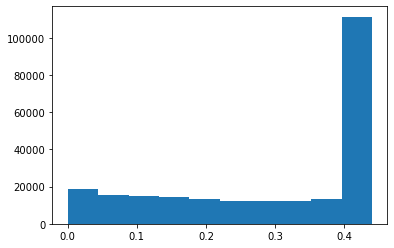

In [16]:
# tide2.data[tide2.mask==True]=-999
plt.hist(tide2.data.flatten())

If we plot these results alongside the DEM, we can see that the near-shore areas (and interpolation) have a large influence on the resulting tidal heights.

In [17]:
dem + tides2

:Layout
   .DynamicMap.I :DynamicMap   []
      :Image   [x,y]   (elevation)
   .Image.I      :Image   [x,y]   (z)

Based on the above, we can see that choosing a point far enough from land to avoid edge effects in our tidal model is important. However, once we are far enough from land, the histogram shows that a very consistent tidal height is computed for the region.

### Constructing a time series of tidal heights at a single point unaffected by coastlines

Previously used fjord mouth values for Sermeq Kujalleq (Jakobshavn Isfjord):
'JI' - lat: 69.1588 lon: 308.8667 (-52.8667)
https://www.pgc.umn.edu/apps/convert/

In [18]:
# Input values:
x = -312319.963189
y = -2260417.83078
t = dt.datetime(2014, 4, 7, hour=15, minute=14, second=32)
    
print(t)

2014-04-07 15:14:32


In [19]:
t0 = t - dt.timedelta(hours=12)
print(t0)

# time series for +/- 12 hours of image time, or over 24 hours, every 5 minutes
ts = np.arange(0, 24*60*60, 5*60)

xs = np.ones(len(ts))*x
ys = np.ones(len(ts))*y

2014-04-07 03:14:32


In [20]:
tidx = list(ts).index(dt.timedelta(hours=12).seconds)

#### Using PyTMD with AOTIM-5-2018

In [21]:
tide = compute_tide_corrections(xs,ys,ts,
    DIRECTORY='/home/jovyan/pyTMD/models', MODEL='AOTIM-5-2018',
    EPOCH=t0.timetuple()[0:6], TYPE='drift', TIME='utc', EPSG=3413)

In [22]:
plot_tides = np.array([[ts[i], tide.data[i]] for i in range(0,len(ts))])
tides = hv.Scatter(plot_tides, kdims='time',vdims='tidal height')
imgtime = hv.Scatter((ts[tidx], tide[tidx]))
tides*imgtime

:Overlay
   .Scatter.I  :Scatter   [time]   (tidal height)
   .Scatter.II :Scatter   [x]   (y)

In [23]:
print('Tidal height correction: ' + str(tide[tidx]))
print('Tidal height local min: ' + str(np.min(tide)))
print('Tidal height local max: ' + str(np.max(tide)))

Tidal height correction: -0.08696794077424083
Tidal height local min: -0.3310350066281309
Tidal height local max: 0.5473122163732279


#### Using PyTMD with AOTIM-5
For comparison, since AOTIM-5-2018 did not exist at the time of the initial calculations to which I am comparing the Matlab results...

In [24]:
tide2 = compute_tide_corrections(xs,ys,ts,
    DIRECTORY='/home/jovyan/pyTMD/models', MODEL='AOTIM-5',
    EPOCH=t0.timetuple()[0:6], TYPE='drift', TIME='utc', EPSG=3413)

In [25]:
plot_tides2 = np.array([[ts[i], tide2.data[i]] for i in range(0,len(ts))])
tides2 = hv.Scatter(plot_tides2, kdims='time',vdims='tidal height')
imgtime2 = hv.Scatter((ts[tidx], tide2[tidx]))
# tides.opts(color='tide', colorbar=True, cmap='BuPu')
tides2 * imgtime2

:Overlay
   .Scatter.I  :Scatter   [time]   (tidal height)
   .Scatter.II :Scatter   [x]   (y)

In [26]:
print('Tidal height correction: ' + str(tide2[tidx]))
print('Tidal height local min: ' + str(np.min(tide2)))
print('Tidal height local max: ' + str(np.max(tide2)))

Tidal height correction: -0.09795946811316424
Tidal height local min: -0.3291545080251233
Tidal height local max: 0.5584402591071085


#### From MatLab TMD Toolbox with AOTIM-5
(these values computed previously, using Matlab 2014b)

In [27]:
print('Tidal height correction: ' + str(-0.101365))
print('Tidal height local min: ' + str(-0.35203746178307965))
print('Tidal height local max: ' + str(0.5928379980608973))

Tidal height correction: -0.101365
Tidal height local min: -0.35203746178307965
Tidal height local max: 0.5928379980608973


#### Conclusion

The tidal height correction for this point/date varies by up to 0.144 m across models and analysis techniques. Although this represents ~17% of the tidal height in this case (where the tidal height is quite small at time t), given the uncertainties inherent in any tidal model, vertical uncertainties in tidal height on the order of cm are sufficient for applying sea level corrections to our DEMs. 

In [28]:
abs((tide[tidx]+0.101365)/tide[tidx]*100)

16.554444198158425